# Интеллектуальная обработка экспериментальных данных
## Лабораторная работа № 1, 2, & 3
### Задание лабораторной работы

1. Введение и постановка цели (ЛР1)
    1. Внимательно изучить описание выбранного датасета (источник, тематика, структура, назначение).
    2. Сформулировать четкую цель исследования. Цель должна быть измеримой (например: «выявить топ-3 факторов, влияющие на уровень заработной платы») и достижимой в рамках доступных данных.
    3. Определить конкретные исследовательские задачи (например: «провести очистку данных», «построить модель прогнозирования»).
    4. Составить список гипотез, которые можно проверить (например: «пол и возраст влияют на уровень дохода»). Каждая гипотеза должна быть проверяема средствами анализа данных.

2. Предварительный обзор данных (ЛР1)
    1. Изучить документацию к датасету. Ответить на вопросы: откуда данные, как собирались, какие есть ограничения.
    2. Загрузить данные в среду анализа (Python + pandas).
    3. Провести первичный обзор:
        - Определить количество строк и столбцов.
        - Изучить типы данных в каждом столбце.
        - Проверить наличие пропусков и дубликатов.
        - Получить базовые статистики (mean, median, min, max, std).

3. Предобработка данных (ЛР1)
    1. Обработка пропусков: Определяем стратегию (удаление, заполнение средним/медианой, использование специальных меток). Обосновываем выбранный метод. Фиксируем все изменения. 
    2. Работа с дубликатами: Находим повторяющиеся записи. Принимаем и обосновываем решение, стоит ли их удалять.
    3. В конце раздела пишем о своих наблюдениях, отмечаем возможные проблемы, и что с ними нужно сделать заказчику (сборщику данных). Например, проверить функцию записи трудовых дней. Можно сразу выписать рекомендации, например, сделать выпадающий список в форму вместо свободного ввода. 

4. Исследовательский анализ данных (EDA) (ЛР2)
    1. Изучаем распределения признаков:
        - Строим гистограммы.
        - Проверяем нормальность распределений, описываем распределения.
        - Находим и комментируем оставшиеся выбросы.
    2. Проводим корреляционный анализ:
        - Строим корреляционную матрицу.
        - Визуализируем с помощью heatmap.
    3. Ищем закономерностей:
        - Проверяем наличие сезонных или временных паттернов (если набор данных позволяет).

5. Визуализация данных (ЛР3)
    - Основные графики:
        - Гистограммы
        - Боксплоты
        - Scatter plot
        - Heatmap
        - Boxen/violin plot при необходимости
    - Требования к оформлению:
        - У каждого графика — заголовок.
        - Оси подписаны.
        - Легенды понятные, единицы измерения определены.
        - Стиль и цвета должны быть единообразными во всем проекте.

6. Прогнозирование и моделирование (ЛР4)
    - Закодируйте категориальные признаки.
    - Выполните нормализацию/стандартизацию числовых признаков (объясните, что это и зачем).
    - Разделить данные на обучающую и тестовую выборки (train/test split).
    - Выбрать несколько моделей (2 и более) для сравнения:
        - Линейная регрессия
        - Деревья решений
        - Random Forest
        - Gradient Boosting
    - Оценить качество моделей:
        - Подобрать метрики (RMSE, MAE, Accuracy, F1 — зависит от задачи).
        - Провести кросс-валидацию.
        - Проанализировать ошибки и сделать выводы.

7. Формулировка выводов (ЛР1 – 4)
    - Структура итоговых выводов:
        1. Подтверждение или опровержение гипотез.
        2. Описание ключевых находок.
        3. Практические рекомендации заказчику.
        4. Указание на ограничения исследования.
        5. Идеи для дальнейшей работы.

## 1.1 Введение и постановка цели

Выбранный датасет: [Датасет об уязвимостях по системе CVE (Common Vulnerabilities and Exposures)](https://www.kaggle.com/datasets/andrewkronser/cve-common-vulnerabilities-and-exposures?select=cve.csv).

### 1.1.1 Описание датасета
#### Источник
Из описания датасета на сайте:
> The National Cybersecurity FFRDC, operated by the Mitre Corporation, maintains the system, with funding from the National Cyber Security Division of the United States Department of Homeland Security.

Данные для системы CVE собирались корпорацией MITRE, которая владеет *National Cybersecurity FFRDC* (Federally Funded Research and Development Center) 

#### Тематика
CVE (Common Vulnerabilities and Exposures) -- база данных общеизвестных уязвимостей информационной безопасности. В ней каждая уязвимость имеет уникальный CVE-ID (`CVE [год]-[номер]`)

#### Структура
Используем только таблицу `cve.csv`. Остальные нам неинтересны, т. к. содержат слишком мало столбцов и только категориальные номинальные признаки с множеством уникальных значений.

| Признак                  | Тип признака                   | Описание                                                                   |
|--------------------------|--------------------------------|----------------------------------------------------------------------------|
| <безымянный>             | Категориальный, номинальный    | CVE-ID                                                                     |
| `mod_date`               | "Числовой", непрерывный (дата) | Дата последнего изменения записи                                           |
| `pub_date`               | "Числовой", непрерывный (дата) | Дата публикации записи                                                     |
| `cvss`                   | Числовой, непрерывный          | CVSS (Common Vulnerability Scoring System), Basic Score                    |
| `cwe_code`               | Числовой, дискретный           | CWE (Common Weakness Enumeration), код категории                           |
| `cwe_name`               | Категориальный, номинальный    | CWE (Common Weakness Enumeration), имя категории                           |
| `summary`                | Категориальный, номинальный    | Краткое описание уязвимости                                                |
| `access_authentication`  | Категориальный, порядковый     | Параметр `Au` для расчёта CVSS: `{'MULTIPLE', 'SINGLE', 'NONE'}`           |
| `access_complexity`      | Категориальный, порядковый     | Параметр `AC` для расчёта CVSS: `{'LOW', 'MEDIUM', 'HIGH'}`                |
| `access_vector`          | Категориальный, порядковый     | Параметр `AV` для расчёта CVSS: `{'LOCAL', 'ADJACENT_NETWORK', 'NETWORK'}` |
| `impact_availability`    | Категориальный, порядковый     | Параметр `A` для расчёта CVSS: `{'NONE', 'PARTIAL', 'COMPLETE'}`           |
| `impact_confidentiality` | Категориальный, порядковый     | Параметр `C` для расчёта CVSS: `{'NONE', 'PARTIAL', 'COMPLETE'}`           |
| `impact_integrity`       | Категориальный, порядковый     | Параметр `I` для расчёта CVSS: `{'NONE', 'PARTIAL', 'COMPLETE'}`           |

#### Назначение
Собранные в рамках проекта CVE данные могут использоваться для различных задач машинного обучения, в том числе:
- предсказание метрики CVSS Basic Score и её параметров по тексту (использование языковых моделей)
- менее содержательная задача: поскольку даже Base Score -- это сложная, ступенчатая нелинейная функция от приведённых параметров, можно попробовать научить некоторые простые модели машинного обучения (линейная регрессия, логистическая регрессия, ...) приближённо предсказывать CVSS (чтобы демонстративно сравнить: 1. значение в датасете, 2. значение по формуле, 3. предсказанное значение).

$$
Exploitability = 20 \cdot AV \cdot AC \cdot Au
$$
$$
Impact = 10.41 \cdot (1 - (1 - C) \cdot (1 - I) \cdot (1 - A))
$$
$$
f(Impact) = \begin{cases}
0 \text{, if } Impact = 0 \\
1.176 \text{, otherwise}
\end{cases}
$$
$$
BaseScore = \text{roundTo1Decimal}(((0.6 \cdot I) + ((0.4 \cdot E) - 1.5) \cdot f(Impact))
$$

### 1.1.2 Цель исследования
Оценить влияние факторов уязвимостей (`attack_authentication`, `attack_complexity`, ...) и времени публикации на CVSS Basic Score; выявить топ-3 факторов по силе связи с CVSS (коэффициент корреляции).

### 1.1.3 Задачи исследования
- Лаб. 1:
    - Изучить описание датасета (источник, как собирался, ограничения).
    - Загрузить данные, сделать первичный обзор.
    - Выполнить предобработку только в рамках ЛР1: обработать пропуски и дубликаты.
- Лаб. 2:
    - Изучить распределения признаков и описать их.
    - Провести корреляционный анализ с непрерывным `cvss`. Проверить статистические гипотезы.
    - Кратко описать возможные временные паттерны (по годам).
- Лаб. 3, 4:
    - Будет заполнено позже, по мере выполнения. 

### 1.1.4 Гипотезы 

- $H_{0}^{(1)}$. Между датой публикации `pub_date` и базовым баллом `cvss` нет монотонной связи. 
    - $H_{1}^{(1)}$. Базовый балл стремится к возрастанию или убыванию с датой публикации.
    - Необходимость проверки обусловлена:
        - В описании датасета не указано, что речь идёт о CVSS v2 и о Basic Score, хотя мы и сделали такое предположение на основе структуры.
        - Возможными несоответствиями версии стандарта, по которому считался балл CVSS. Например, если новые записи считались по CVSS v3 (или v3.1), но для совместимости были использованы метрики со старыми названиями.
        - Другими возможными ошибками, из-за которых значение в датасете будет не равно значению по формуле.
        - Возможными изменениями в подходе к оценке этих базовых метрик, на основе которых рассчитывается Base Score. Например, с течением времени какую-либо из метрик стали оценивать более пессимистично.
    - Можно проверить с помощью критерия Спирмена (корреляция).
- $H_{0}^{(2)}$. Увеличение количества `COMPLETE` среди `{impact_integrity, impact_confidentiality, impact_availability}` не увеличивает `cvss`.   
    - $H_{1}^{(2)}$. Чем больше `COMPLETE` среди `{impact_integrity, impact_confidentiality, impact_availability}`, тем выше базовый балл `cvss`. 
    - Можно проверить с помощью критерия Спирмена (корреляция).
- $H_{0}^{(3)}$. Выполняется правило `Impact==0 => BaseScore==0` (`Impact == 0`, когда `impact_integrity == impact_confidentiality == impact_availability == 'NONE'`)
    - $H_{1}^{(3)}$. Найдены нарушения этого правила.
    - Инвариант или биномиальный тест.

## 1.2 Предварительный обзор данных
### 1.2.1 Изучение документации
#### Откуда данные?
Данные взяты из системы CVE, которую поддерживает National Cybersecurity FFRDC, управляемый корпорацией MITRE. Эти данные находятся в публичном доступе.

#### Как собирались?
Добавлением записей в систему CVE занимаются CVE Numbering Authorities (CNA). Главным из них является корпорация MITRE, но эта роль также принадлежит и многим крупным компаниям (Microsoft, Oracle, ...)

#### Ограничения?
- В датасете собраны только записи, опубликованные с 1 января 1999 по 21 ноября 2019. Датасет на Kaggle в последний раз обновлялся 6 лет назад.
- Дата последнего изменения -- с 10 января 2008 по 21 ноября 2019.
- В некоторых записях (таких <1% от общего числа записей) отсутствуют метрики, используемые для вычисления базового балла CVSS v2.
- Возможная утечка данных (Data Leakage), так как базовый балл `cvss` можно вычислить на основе только метрик CVSS, которые здесь также присутствуют. Можно попробовать оценить правильность расчёта (совпадение значения из датасета и рассчитанного по формуле).

### 1.2.2 Загрузка данных
Установка библиотек

In [1]:
!pip install numpy pandas scipy matplotlib seaborn kagglehub

  Obtaining dependency information for kagglehub from https://files.pythonhosted.org/packages/a4/8e/4077b08b95a1f8302c694a8b399bd413815fbe89045c41e6e08cd7d9439a/kagglehub-0.3.13-py3-none-any.whl.metadata
  Using cached kagglehub-0.3.13-py3-none-any.whl.metadata (38 kB)
  Obtaining dependency information for tqdm from https://files.pythonhosted.org/packages/d0/30/dc54f88dd4a2b5dc8a0279bdd7270e735851848b762aeb1c1184ed1f6b14/tqdm-4.67.1-py3-none-any.whl.metadata
  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
Using cached kagglehub-0.3.13-py3-none-any.whl (68 kB)
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)



[notice] A new release of pip is available: 23.2.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Скачивание датасета (он будет в сжатом формате)

In [2]:
import kagglehub

# Download only this file; returns the local path
path = kagglehub.dataset_download(
    "andrewkronser/cve-common-vulnerabilities-and-exposures",
    path="cve.csv"
)
print(path)

C:\Users\vadim\.cache\kagglehub\datasets\andrewkronser\cve-common-vulnerabilities-and-exposures\versions\3\cve.csv


Импорт библиотек

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats

Загрузка датасета. Первый столбец без названия, он содержит код CVE для уязвимости, его нужно переименовать:

In [4]:
df = pd.read_csv(path, encoding="utf-8", compression="zip", parse_dates=["mod_date", "pub_date"])

first = df.columns[0]
if (first == "") or str(first).startswith("Unnamed"):
    df.rename(columns={first: "cve_id"}, inplace=True)

Первые 10 строк датасета

In [5]:
df.head(n=10)

,cve_id,mod_date,pub_date,cvss,cwe_code,cwe_name,summary,access_authentication,access_complexity,access_vector,impact_availability,impact_confidentiality,impact_integrity
0,CVE-2019-16548,2019-11-21 15:15:00,2019-11-21 15:15:00,6.8,352,Cross-Site Request Forgery (CSRF),A cross-site request forgery vulnerability in ...,NaN,NaN,NaN,NaN,NaN,NaN
1,CVE-2019-16547,2019-11-21 15:15:00,2019-11-21 15:15:00,4.0,732,Incorrect Permission Assignment for Critical ...,Missing permission checks in various API endpo...,NaN,NaN,NaN,NaN,NaN,NaN
2,CVE-2019-16546,2019-11-21 15:15:00,2019-11-21 15:15:00,4.3,639,Authorization Bypass Through User-Controlled Key,Jenkins Google Compute Engine Plugin 4.1.1 and...,NaN,NaN,NaN,NaN,NaN,NaN
3,CVE-2013-2092,2019-11-20 21:22:00,2019-11-20 21:15:00,4.3,79,Improper Neutralization of Input During Web P...,Cross-site Scripting (XSS) in Dolibarr ERP/CRM...,NaN,NaN,NaN,NaN,NaN,NaN
4,CVE-2013-2091,2019-11-20 20:15:00,2019-11-20 20:15:00,7.5,89,Improper Neutralization of Special Elements u...,SQL injection vulnerability in Dolibarr ERP/CR...,NaN,NaN,NaN,NaN,NaN,NaN
5,CVE-2013-1817,2019-11-20 20:15:00,2019-11-20 20:15:00,5.0,200,Information Exposure,MediaWiki before 1.19.4 and 1.20.x before 1.20...,NaN,NaN,NaN,NaN,NaN,NaN
6,CVE-2013-1816,2019-11-20 20:15:00,2019-11-20 20:15:00,5.0,20,Improper Input Validation,MediaWiki before 1.19.4 and 1.20.x before 1.20...,NaN,NaN,NaN,NaN,NaN,NaN
7,CVE-2012-1257,2019-11-20 20:15:00,2019-11-20 20:15:00,2.1,319,Cleartext Transmission of Sensitive Information,Pidgin 2.10.0 uses DBUS for certain cleartext ...,NaN,NaN,NaN,NaN,NaN,NaN
8,CVE-2011-4455,2019-11-20 20:10:00,2019-11-20 19:15:00,4.3,79,Improper Neutralization of Input During Web P...,Multiple cross-site scripting vulnerabilities ...,NaN,NaN,NaN,NaN,NaN,NaN
9,CVE-2011-4454,2019-11-20 20:10:00,2019-11-20 19:15:00,4.3,79,Improper Neutralization of Input During Web P...,Multiple cross-site scripting vulnerabilities ...,NaN,NaN,NaN,NaN,NaN,NaN


Описание столбцов датасета, с основными статистическими метриками

In [6]:
df.describe(include="all")

,cve_id,mod_date,pub_date,cvss,cwe_code,cwe_name,summary,access_authentication,access_complexity,access_vector,impact_availability,impact_confidentiality,impact_integrity
count,89660,89660,89660,89660.000000,89660.000000,89660,89660,88776,88776,88776,88776,88776,88776
unique,89660,NaN,NaN,NaN,NaN,170,87432,3,3,3,3,3,3
top,CVE-2007-3004,NaN,NaN,NaN,NaN,Improper Restriction of Operations within the...,A remote code execution vulnerability was iden...,NONE,LOW,NETWORK,PARTIAL,PARTIAL,PARTIAL
freq,1,NaN,NaN,NaN,NaN,12344,83,76777,45746,76104,35991,42039,46357
mean,NaN,2017-09-26 16:10:18.163952640,2015-03-10 06:07:30.900067072,6.021429,199.690854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,2008-01-10 05:00:00,1999-01-01 05:00:00,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,2017-07-14 14:51:45,2012-04-25 10:10:00,4.300000,79.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,2018-03-05 15:56:30,2016-08-08 01:59:00,5.800000,119.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,2019-04-05 18:16:30,2018-06-17 16:29:00,7.500000,284.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,2019-11-21 15:15:00,2019-11-21 15:15:00,10.000000,1188.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Информация о столбцах, их типах данных и числе non-null записей

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89660 entries, 0 to 89659
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   cve_id                  89660 non-null  object        
 1   mod_date                89660 non-null  datetime64[ns]
 2   pub_date                89660 non-null  datetime64[ns]
 3   cvss                    89660 non-null  float64       
 4   cwe_code                89660 non-null  int64         
 5   cwe_name                89660 non-null  object        
 6   summary                 89660 non-null  object        
 7   access_authentication   88776 non-null  object        
 8   access_complexity       88776 non-null  object        
 9   access_vector           88776 non-null  object        
 10  impact_availability     88776 non-null  object        
 11  impact_confidentiality  88776 non-null  object        
 12  impact_integrity        88776 non-null  object

### 1.2.3 Первичный обзор данных

Подсчёт числа строк с NA:

In [8]:
print('Count of NA values per column:')
for column in df.columns:
    na_count = df.isna()[column].sum()
    if na_count > 0:
        print(f'- {column}: {na_count} ({(na_count / df.shape[0] * 100):.2f}%)')
na_total_count = df.isna().any(axis=1).sum()
print(f'Count of all rows with any NA values: {na_total_count} of {df.shape[0]} ({(na_total_count / df.shape[0] * 100):.2f}%)')

Count of NA values per column:
- access_authentication: 884 (0.99%)
- access_complexity: 884 (0.99%)
- access_vector: 884 (0.99%)
- impact_availability: 884 (0.99%)
- impact_confidentiality: 884 (0.99%)
- impact_integrity: 884 (0.99%)
Count of all rows with any NA values: 884 of 89660 (0.99%)


Подсчёт числа дубликатов:

In [9]:
print(f'''
Exact duplicates: {df.duplicated().sum()}
Duplicates by key: {df["cve_id"].duplicated().sum()}
Unique values count: {df["cve_id"].nunique()} ({df["cve_id"].nunique() / df.shape[0] * 100:.2f}%)
''')


Exact duplicates: 0
Duplicates by key: 0
Unique values count: 89660 (100.00%)



Первичная визуализация:

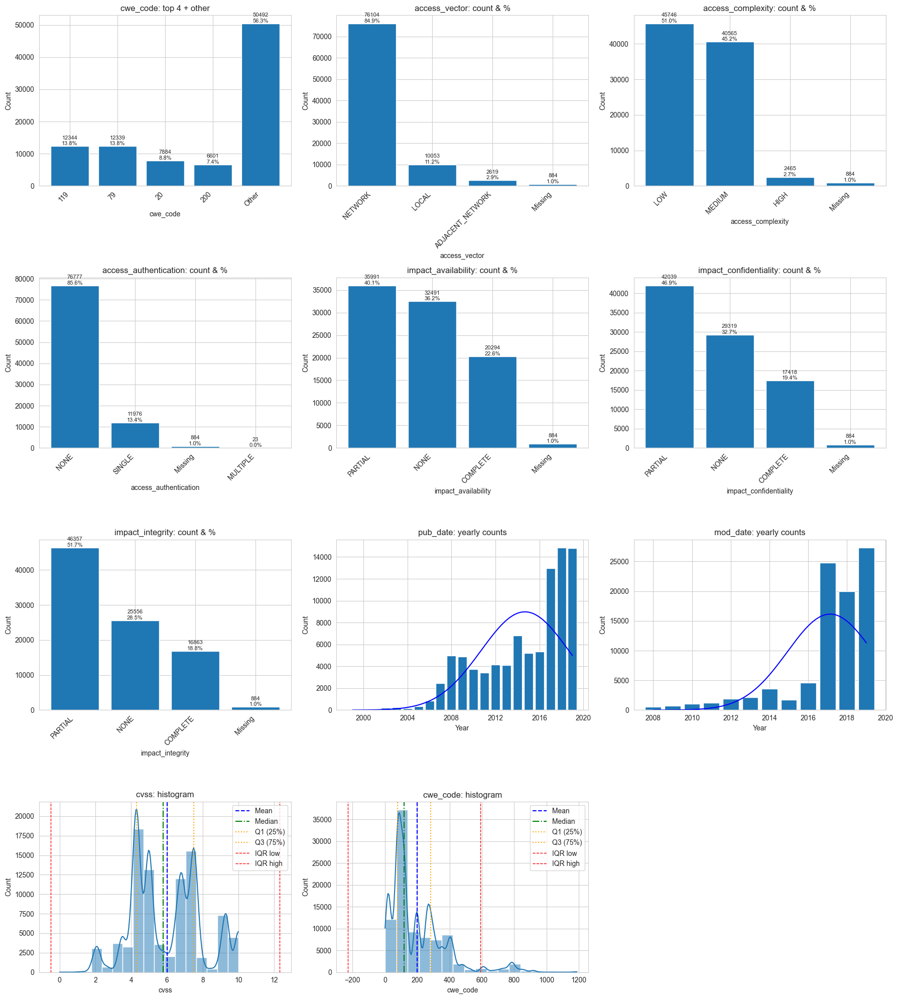

In [10]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, math

def sturges(n: int) -> int:  # you provided this
    return int(np.floor(np.log2(max(n,1)) + 1))

def norm_function(x: np.float64, mean: np.float64, std: np.float64) -> np.float64:
    return (1 / np.sqrt(2 * np.pi) / std) * np.exp((-(x - mean) ** 2) / (2 * std ** 2))

viz_types = {
    "str_many": ["cwe_code"],
    "str_few": [
        "access_vector",
        "access_complexity",
        "access_authentication",
        "impact_availability",
        "impact_confidentiality",
        "impact_integrity",
    ],
    "date": ["pub_date","mod_date"],
    "numeric": ["cvss", "cwe_code"],
}
TOP_N, TRUNC, NUM_COLS = 4, 24, 3

def _annot(ax, vals, total):
    for i, v in enumerate(vals):
        pct = (v/total*100) if total else 0
        ax.text(i, v, f"{int(v)}\n{pct:.1f}%", ha="center", va="bottom", fontsize=8)

def plot_numeric(ax, s, name, norm=False, stats=True) -> dict[str, float] | None:
    x = pd.to_numeric(s, errors="coerce").dropna().values
    if x.size == 0:
        ax.text(0.5, 0.5, "No numeric data", ha="center", va="center", transform=ax.transAxes)
        ax.set_title(f"{name}: histogram")
        return {}

    nbins = sturges(x.size)

    # Histogram
    if norm:
        # use matplotlib's hist so we can grab bin edges for a scaled normal overlay
        n, bins, _ = ax.hist(x, bins=nbins)
    else:
        # use seaborn when no normal overlay is requested
        sns.histplot(x=x, bins=nbins, stat="count", ax=ax, kde=True)
        bins = None  # not needed unless norm is True

    ax.set_title(f"{name}: histogram")
    ax.set_xlabel(name); ax.set_ylabel("Count")

    # Gaussian overlay (scaled to histogram counts) only when norm=True
    if norm and x.size > 1:
        mean = x.mean()
        std = x.std(ddof=0)
        if std > 0 and bins is not None:
            xs = np.linspace(x.min(), x.max(), 400)
            bin_w = np.diff(bins).mean()
            ax.plot(xs, norm_function(xs, mean, std) * x.size * bin_w,
                    lw=2, label="Normal fit", color="blue")

    out = {}
    if stats and x.size > 1:
        q1, q2, q3 = np.percentile(x, [25, 50, 75])
        iqr = q3 - q1
        low = q1 - 1.5*iqr
        high = q3 + 1.5*iqr
        mean = x.mean()

        # vertical guides
        def vline(val, label, style):
            ax.axvline(val, **style, label=label)

        vline(mean, "Mean",   dict(ls="--", lw=1.5, color="blue"))
        vline(q2,   "Median", dict(ls="-.", lw=1.5, color="green"))
        vline(q1,   "Q1 (25%)", dict(ls=":", lw=1.5, color="orange"))
        vline(q3,   "Q3 (75%)", dict(ls=":", lw=1.5, color="orange"))
        vline(low,  "IQR low", dict(ls="--", lw=1, color="red"))
        vline(high, "IQR high", dict(ls="--", lw=1, color="red"))

        ax.legend(loc="best")

        out = {
            "count": int(x.size),
            "mean": float(mean),
            "std": float(x.std(ddof=0)),
            "min": float(x.min()),
            "q1": float(q1),
            "median": float(q2),
            "q3": float(q3),
            "max": float(x.max()),
            "iqr": float(iqr),
            "iqr_low": float(low),
            "iqr_high": float(high),
        }

    return out

def plot_date(ax, s, name, norm=True):
    y = s.dt.to_period("Y").dropna()
    vc = y.value_counts().sort_index()
    x = vc.index.to_timestamp()
    ax.bar(x, vc.values, width=300)  # ~300 days so bars are visible
    ax.set_title(f"{name}: yearly counts")
    ax.set_xlabel("Year")
    ax.set_ylabel("Count")

    if norm and len(vc) > 1:
        w = vc.values.astype(float)
        x_num = mdates.date2num(x)          # days as float
        N = w.sum()
        mu = (w * x_num).sum() / N
        sigma = np.sqrt((w * (x_num - mu) ** 2).sum() / N)
        if sigma > 0:
            xs = np.linspace(x_num.min(), x_num.max(), 400)
            bin_w = np.mean(np.diff(x_num)) if len(x_num) > 1 else 365.25
            ys = norm_function(xs, mu, sigma) * N * bin_w  # scale PDF to counts
            ax.plot(mdates.num2date(xs), ys, color="blue")

def plot_str_few(ax, s, name):
    vc = s.astype("string").fillna("Missing").value_counts()
    labels = list(vc.index.astype(str))
    vals = vc.values; total = int(vc.sum())
    ax.bar(range(len(labels)), vals)
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_title(f"{name}: count & %")
    ax.set_xlabel(name)
    ax.set_ylabel("Count")
    _annot(ax, vals, total)

def plot_str_many(ax, s, name, k=TOP_N, trunc=TRUNC):
    vc = s.astype("string").fillna("Missing").value_counts()
    if len(vc) <= k:
        labels, vals = list(vc.index.astype(str)), vc.values
    else:
        top, other = vc.iloc[:k], vc.iloc[k:].sum()
        labels, vals = list(top.index.astype(str)), np.append(top.values, other)
        labels += ["Other"]
    labels = [lbl[:trunc] + ("…" if len(lbl) > trunc else "") for lbl in labels]
    total = int(vc.sum())
    ax.bar(range(len(labels)), vals)
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_title(f"{name}: top {k} + other")
    ax.set_xlabel(name); ax.set_ylabel("Count")
    _annot(ax, vals, total)

plotter = {
    "numeric": plot_numeric,
    "date": plot_date,
    "str_few": plot_str_few,
    "str_many": plot_str_many,
}

specs = [(kind, col) for kind, cols in viz_types.items() for col in cols if col in df.columns]
n = len(specs)
nrows = math.ceil(n/NUM_COLS)
fig, axes = plt.subplots(nrows=nrows, ncols=NUM_COLS, figsize=(NUM_COLS*6, nrows*5))
axes = np.ravel(axes)

for ax, (kind, col) in zip(axes, specs):
    plotter[kind](ax, df[col], col)

# hide any unused axes
for ax in axes[len(specs):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

Заодно проверим, совпадает ли расчётный СVSS v2 Basic Score со значениями из датасета

In [11]:
from decimal import Decimal, ROUND_HALF_UP
from typing import Literal, Dict

AccessVector = Literal["LOCAL", "ADJACENT_NETWORK", "NETWORK"]
AccessComplexity = Literal["LOW", "MEDIUM", "HIGH"]
AccessAuthentication = Literal["MULTIPLE", "SINGLE", "NONE"]
ImpactLevel = Literal["NONE", "PARTIAL", "COMPLETE"]

AV_W: dict[AccessVector, Decimal] = {
    "LOCAL": Decimal("0.395"),
    "ADJACENT_NETWORK": Decimal("0.646"),
    "NETWORK": Decimal("1.0"),
}
AC_W: dict[AccessComplexity, Decimal] = {
    "HIGH": Decimal("0.35"),
    "MEDIUM": Decimal("0.61"),
    "LOW": Decimal("0.71"),
}
AU_W: dict[AccessAuthentication, Decimal] = {
    "MULTIPLE": Decimal("0.45"),
    "SINGLE": Decimal("0.56"),
    "NONE": Decimal("0.704"),
}
IMPACT_W: dict[ImpactLevel, Decimal] = {
    "NONE": Decimal("0.0"),
    "PARTIAL": Decimal("0.275"),
    "COMPLETE": Decimal("0.660"),
}

def cvss_v2_basic_score_precise(
        access_vector: AccessVector,
        access_complexity: AccessComplexity,
        access_authentication: AccessAuthentication,
        impact_confidentiality: ImpactLevel,
        impact_integrity: ImpactLevel,
        impact_availability: ImpactLevel,
) -> Decimal:
    av = AV_W[access_vector.upper()]
    ac = AC_W[access_complexity.upper()]
    au = AU_W[access_authentication.upper()]
    c = IMPACT_W[impact_confidentiality.upper()]
    i = IMPACT_W[impact_integrity.upper()]
    a = IMPACT_W[impact_availability.upper()]
    
    _ZERO = Decimal("0")
    _ONE = Decimal("1")
    _TEN = Decimal("10")

    def _round1(x: Decimal) -> Decimal:
        """Round to one decimal place using half-up (matches common CVSS calculators)."""
        return x.quantize(Decimal("0.1"), rounding=ROUND_HALF_UP)
    
    exploitability = Decimal("20") * av * ac * au
    impact = Decimal("10.41") * (_ONE - (_ONE - c) * (_ONE - i) * (_ONE - a))
    f_impact = _ZERO if impact == _ZERO else Decimal("1.176")
    base_score = _round1(
        (
            Decimal("0.6") * impact +
            Decimal("0.4") * exploitability -
            Decimal("1.5")
        ) * f_impact
    )
    base_score = max(_ZERO, min(base_score, _TEN))
    return base_score

_record = df[(~df.isna()).all(axis=1)].iloc[0]
f'''Calculated score: {
    _record['cvss']
}, Dataset score: {
    cvss_v2_basic_score_precise(
        access_authentication=_record['access_authentication'],
        access_complexity=_record['access_complexity'],
        access_vector=_record['access_vector'],
        impact_confidentiality=_record['impact_confidentiality'],
        impact_integrity=_record['impact_integrity'],
        impact_availability=_record['impact_availability']
    )
}'''

'Calculated score: 7.8, Dataset score: 7.8'

In [12]:
df2 = df.copy(deep=True).dropna()
df2['cvss_calculated'] = df2.apply(
    lambda row: cvss_v2_basic_score_precise(
            access_authentication=row['access_authentication'],
            access_complexity=row['access_complexity'],
            access_vector=row['access_vector'],
            impact_confidentiality=row['impact_confidentiality'],
            impact_integrity=row['impact_integrity'],
            impact_availability=row['impact_availability']
    ),
    axis=1
)
df2['cvss_mismatch'] = df2['cvss_calculated'] != df2['cvss'].map(lambda num: Decimal(str(num)).quantize(Decimal("0.1"), rounding=ROUND_HALF_UP))
_cvss_mismatch_count = df2['cvss_mismatch'].sum()
print(f"CVSS mismatches: {_cvss_mismatch_count} ({(_cvss_mismatch_count / df2.shape[0] * 100):.3f}%)")
df2[df2['cvss_mismatch']]

CVSS mismatches: 6 (0.007%)


,cve_id,mod_date,pub_date,cvss,cwe_code,cwe_name,summary,access_authentication,access_complexity,access_vector,impact_availability,impact_confidentiality,impact_integrity,cvss_calculated,cvss_mismatch
2423,CVE-2019-1369,2019-10-11 15:07:00,2019-10-10 14:15:00,2.1,200,Information Exposure,An information disclosure vulnerability exists...,NONE,LOW,NETWORK,NONE,PARTIAL,NONE,5.0,True
3071,CVE-2019-4093,2019-10-09 23:50:00,2019-04-02 14:29:00,3.6,284,Improper Access Control,IBM Tivoli Storage Manager (IBM Spectrum Prote...,SINGLE,LOW,LOCAL,NONE,PARTIAL,PARTIAL,3.2,True
18384,CVE-2019-0090,2019-06-21 03:15:00,2019-05-17 16:29:00,4.4,284,Improper Access Control,Insufficient access control vulnerability in s...,NONE,LOW,LOCAL,PARTIAL,PARTIAL,PARTIAL,4.6,True
21020,CVE-2019-2638,2019-05-03 20:29:00,2019-04-23 19:32:00,6.5,284,Improper Access Control,Vulnerability in the Oracle General Ledger com...,SINGLE,LOW,NETWORK,NONE,PARTIAL,PARTIAL,5.5,True
21021,CVE-2019-2633,2019-05-03 20:29:00,2019-04-23 19:32:00,6.5,284,Improper Access Control,Vulnerability in the Oracle Work in Process co...,SINGLE,LOW,NETWORK,NONE,PARTIAL,PARTIAL,5.5,True
22158,CVE-2019-0876,2019-04-11 16:23:00,2019-04-09 21:29:00,2.1,200,Information Exposure,An information disclosure vulnerability exists...,NONE,MEDIUM,NETWORK,NONE,PARTIAL,NONE,4.3,True


Как можно видеть, процент ошибок очень мал.

## 1.3 Предобработка данных

### 1.3.1 Поиск и обработка дубликатов
В этом датасете, как уже было проверено, нет полных дубликатов или дубликатов по `cve_id`. Все `cve_id` уникальные:

In [13]:
print(f'''
Exact duplicates: {df.duplicated().sum()}
Duplicates by key: {df["cve_id"].duplicated().sum()}
Unique values count: {df["cve_id"].nunique()} ({df["cve_id"].nunique() / df.shape[0] * 100:.2f}%)
''')


Exact duplicates: 0
Duplicates by key: 0
Unique values count: 89660 (100.00%)



Также проверим, что число уникальных `cwe_name` равно числу уникальных `cwe_code`; что каждому `cwe_code` однозначно соответствует один `cwe_name` и наоборот:

In [14]:
print(f"""cwe_code unique: {df['cwe_code'].nunique()}
cwe_name unique: {df['cwe_name'].nunique()}
(cwe_code, cwe_name) unique: {df[['cwe_code', 'cwe_name']].drop_duplicates().shape[0]}""")

cwe_code unique: 170
cwe_name unique: 170
(cwe_code, cwe_name) unique: 170


### 1.3.2 Обработка отсутствующих значений

Ещё раз проверим отсутствующие значения:

In [15]:
print('Count of NA values per column:')
for column in df.columns:
    na_count = df.isna()[column].sum()
    if na_count > 0:
        print(f'- {column}: {na_count} ({(na_count / df.shape[0] * 100):.2f}%)')
na_total_count = df.isna().any(axis=1).sum()
print(f'Count of all rows with any NA values: {na_total_count} of {df.shape[0]} ({(na_total_count / df.shape[0] * 100):.2f}%)')

Count of NA values per column:
- access_authentication: 884 (0.99%)
- access_complexity: 884 (0.99%)
- access_vector: 884 (0.99%)
- impact_availability: 884 (0.99%)
- impact_confidentiality: 884 (0.99%)
- impact_integrity: 884 (0.99%)
Count of all rows with any NA values: 884 of 89660 (0.99%)


Это говорит, что строк с отсутствующими значениями -- <1% от общего количества. Также, по-видимому, эти значения отсутствуют в одних и тех же строках, судя по количеству.

Посмотрим, как отсутствующие значения распределены по годам:

In [16]:
cols = ["access_authentication","access_complexity","access_vector",
        "impact_availability","impact_confidentiality","impact_integrity"]
m = df[cols].isna().any(axis=1)

year = pd.to_datetime(df["pub_date"], errors="coerce").dt.year
by_year = (pd.DataFrame({"year": year, "missing": m})
           .groupby("year", dropna=False)["missing"]
           .agg(count="count", missing="sum"))
by_year["rate_%"] = 100 * by_year["missing"] / by_year["count"]

overall = 100 * m.mean()
print(by_year.tail(15))
print(f"Overall missing rate: {overall:.2f}%")
# Quick flag: years with missing rate > 3× overall
print("Years >3× overall:", by_year.index[by_year["rate_%"] > 3*overall].tolist())

      count  missing    rate_%
year                          
2005    356        0  0.000000
2006    864        0  0.000000
2007   2435       11  0.451745
2008   4991        5  0.100180
2009   4909        0  0.000000
2010   3755        0  0.000000
2011   3396        0  0.000000
2012   4135        0  0.000000
2013   4125        0  0.000000
2014   6825        0  0.000000
2015   5217        0  0.000000
2016   5325        0  0.000000
2017  12965        1  0.007713
2018  14855        0  0.000000
2019  14800      867  5.858108
Overall missing rate: 0.99%
Years >3× overall: [2019]


Видим, что больше всего пропусков (и по количеству, и в процентном соотношении) в 2019. Пропуски сконцентрированы во времени. Тем не менее, импутацию лучше не применять, т. к. это может существенно ухудшить качество расчёта CVSS (соответствие между датасетом и формулой). Целесообразно взять подмножество датасета и использовать его только там, где нам нужны метрики CVSS.

In [17]:
base_cols = ["access_authentication","access_complexity","access_vector",
             "impact_availability","impact_confidentiality","impact_integrity"]
df_req = df.dropna(subset=base_cols)
assert (df.shape[0] - df_req.shape[0]) == df.isna().any(axis=1).sum()

### 1.3.3 Наблюдения, возможные проблемы
#### Наблюдения
- Датасет содержит 89660 записей. Базовые метрики CVSS v2 (AV, AC, Au, C, I, A) представлены отдельными столбцами.
- Значения в этих столбцах соответствуют допустимым перечислениям CVSS v2 (внеcловарных токенов не обнаружено).
- Пропуски касаются только шести базовых метрик и встречаются в 0.99% строк (884/89660). В данном случае это всегда совместные пропуски всех шести полей в одной записи.
- Есть временная концентрация пропусков: в 2019 г. >5% записей с отсутствующими базовыми метриками при общем уровне 0.99%; в остальные годы доля близка к нулю. Это указывает на вероятные особенности сбора/загрузки именно за этот период.
- Поле `cvss` — числовое (0..10), даты публикации/изменения присутствуют (`pub_date`, `mod_date`). Поля CWE представлены кодом и названием.
- Проверкой подтверждена взаимно-однозначная связь `cwe_code <-> cwe_name` (число уникальных кодов = числу уникальных названий = числу уникальных пар); всего 170 категорий.

#### Возможные проблемы.
- Структурная неполнота по 2019 г. (и некоторым другим годам, но в меньшей степени) может смещать любые анализы, использующие AV/AC/Au/C/I/A (этот год будет недопредставлен).
- Отсутствует указание версии CVSS и подтверждение того, что это Basic Score — это затрудняет проверку согласованности и воспроизводимость расчёта `cvss`. Мы не всегда можем быть уверены, что данные указаны для v2, а не, например, v3 (там появились новые метрики и были переработаны старые, но при вводе данных это могли не учесть).

#### Рекомендации заказчику
- Явно указывать в форме для ввода данных, что метрики нужно использовать именно из v2, тип метрики Base Score.
- На основе введённых параметров рассчитывать Base Score только автоматически, с соблюдением всех правил округления (можно использовать для расчёта `Decimal`/`BigDecimal`/аналоги).
- Документировать источники пропусков за 2019 г. и другие (особенности выгрузки/разметки). В дальнейшем -- по возможности восстановить эти значения при обновлениях данных; если восстановление не планируется, указать причину в описании набора.

## 2.1 Исследовательский анализ данных
### 2.1.1 Изучение распределений признаков

Гистограммы (для числовых признаков и даты) были уже построены ранее.

Здесь отдельно рассмотрим только `cvss`, `pub_date`, `mod_date`.

Проверим нормальность распределения для них (тест Д'Агостино, $K^2$), рассчитаем основные параметры ($\mu$, $\sigma$).

In [18]:
ALPHA = 0.05

for col in ['cvss', 'pub_date', 'mod_date']:
    s = df[col]
    is_dt = np.issubdtype(s.dtype, np.datetime64) or ('date' in col.lower())
    if is_dt:
        dt = pd.to_datetime(s, errors='coerce').dropna().astype('datetime64[s]')
        vals = dt.view('int64').to_numpy()
    else:
        vals = pd.to_numeric(s, errors='coerce').dropna().to_numpy()

    k2, p = stats.normaltest(vals)
    mu, sigma = vals.mean(), vals.std(ddof=0)

    if is_dt:
        mu_str = pd.to_datetime(int(round(mu)), unit='s').strftime('%Y-%m-%d %H:%M:%S')
        print(f"{col}:N={len(vals)}, μ≈{mu_str}, σ≈{sigma:.0f}s; normal? {'YES' if p>ALPHA else 'NO'} (p={p:.3g})")
    else:
        print(f"{col}: N={len(vals)}, μ={mu:.3f}, σ={sigma:.3f}; normal? {'YES' if p>ALPHA else 'NO'} (p={p:.3g})")



cvss: N=89660, μ=6.021, σ=1.995; normal? NO (p=0)
pub_date:N=89660, μ≈2015-03-10 06:07:31, σ≈125255577s; normal? NO (p=0)
mod_date:N=89660, μ≈2017-09-26 16:10:18, σ≈70625931s; normal? NO (p=0)


C:\Users\vadim\AppData\Local\Temp\ipykernel_48336\1633710792.py:8: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  vals = dt.view('int64').to_numpy()
C:\Users\vadim\AppData\Local\Temp\ipykernel_48336\1633710792.py:8: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  vals = dt.view('int64').to_numpy()


Как можем видеть, ни одно из распределений не является нормальным (не можем принять гипотезу о нормальности даже на уровне значимости $\alpha = 0.05$)

Построим графики типа "ящик с усами" для этих признаков, чтобы увидеть медиану, квартили и выбросы:

cvss: N=89660, outliers ↓0 (0.00%), ↑0 (0.00%)
pub_date: N=89660, outliers ↓317 (0.35%), ↑0 (0.00%)
mod_date: N=89660, outliers ↓11138 (12.42%), ↑0 (0.00%)


C:\Users\vadim\AppData\Local\Temp\ipykernel_48336\4276981385.py:8: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  return pd.to_datetime(s, errors='coerce').astype('datetime64[s]').view('int64')  # seconds
C:\Users\vadim\AppData\Local\Temp\ipykernel_48336\4276981385.py:8: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  return pd.to_datetime(s, errors='coerce').astype('datetime64[s]').view('int64')  # seconds


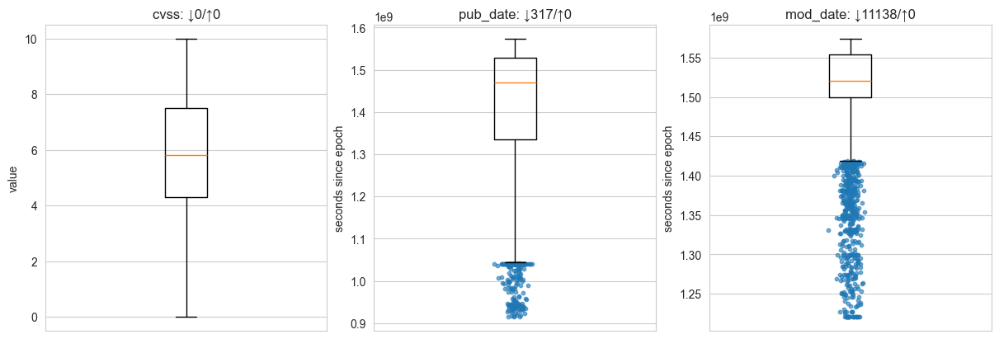

In [19]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt

cols = ['cvss', 'pub_date', 'mod_date']
data = {}

def to_numeric_series(s: pd.Series) -> pd.Series:
    if np.issubdtype(s.dtype, np.datetime64) or ('date' in s.name.lower()):
        return pd.to_datetime(s, errors='coerce').astype('datetime64[s]').view('int64')  # seconds
    return pd.to_numeric(s, errors='coerce')

for c in cols:
    s_num = to_numeric_series(df[c]).dropna()
    q1, q3 = np.percentile(s_num, [25, 75])
    iqr = q3 - q1
    lb, ub = q1 - 1.5 * iqr, q3 + 1.5 * iqr
    below = s_num[s_num < lb]
    above = s_num[s_num > ub]
    data[c] = dict(vals=s_num, lb=lb, ub=ub, below=below, above=above)

    n = len(s_num)
    print(f"{c}: N={n}, outliers ↓{len(below)} ({len(below)/n:.2%}), "
          f"↑{len(above)} ({len(above)/n:.2%})")

fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

rng = np.random.default_rng(0)
for ax, (c, d) in zip(axes, data.items()):
    _MAX_DOTS = 512
    _SEED = 267
    
    ax.boxplot(d['vals'], vert=True, showfliers=False)
    y = pd.concat([
        d['below'].sample(n=min(_MAX_DOTS, d['below'].size), random_state=_SEED), 
        d['above'].sample(n=min(_MAX_DOTS, d['above'].size), random_state=_SEED)
    ])
    if len(y):
        x = 1 + rng.normal(0, 0.02, size=len(y))
        ax.scatter(x, y, s=10, alpha=0.6)

    title = f"{c}: ↓{len(d['below'])}/↑{len(d['above'])}"
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_ylabel('value' if c == 'cvss' else 'seconds since epoch')

plt.show()


- `cvss`. По правилу Тьюки (IQR·1.5) выбросов не обнаружено. При том что шкала ограничена `[0, 10]` и квантована (шаг 0.1), распределение в этой выборке не даёт значений за «усами» boxplot — это штатно и не требует действий.

- Даты (`pub_date`, `mod_date`). Обнаружены только нижние выбросы (↓N; ↑0). Это отражает правостороннюю асимметрию календаря публикаций/обновлений (бóльшая часть записей приходится на поздние годы), а не ошибки данных. Удалять такие записи не нужно; используем их как характеристику хвоста распределения.

- Вывод по выбросам. Удаление/импутация не выполнялись: для `cvss` выбросов нет, для дат нижние «выбросы» отражают ранние CVE и корректно описывают хвост; они не противоречат логике предметной области.

### 2.1.2 Корреляционный анализ
Для построения корреляционной матрицы используем числовые непрерывные признак (`cvss`, дата) и параметры CVSS (преобразуем их в числа так, как это делается в CVSS v2)

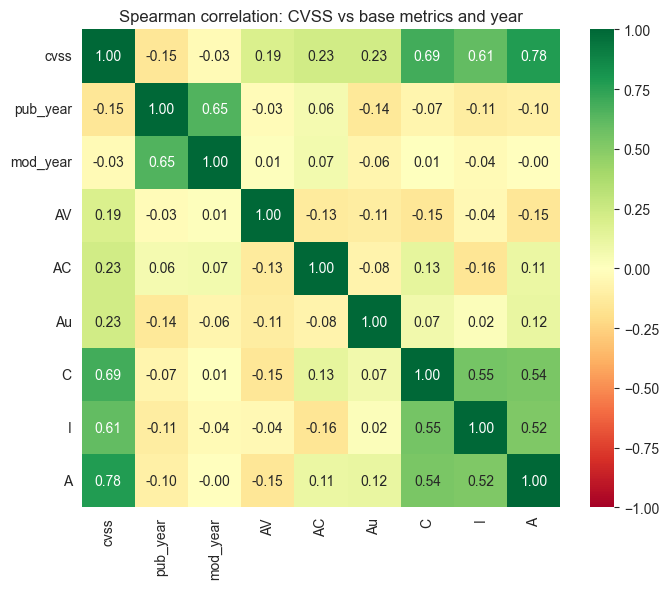

In [20]:
AV_W_F = {k: float(v) for k, v in AV_W.items()}
AC_W_F = {k: float(v) for k, v in AC_W.items()}
AU_W_F = {k: float(v) for k, v in AU_W.items()}
IMPACT_W_F = {k: float(v) for k, v in IMPACT_W.items()}

_df = df

# Build a compact numeric DataFrame
df_corr = pd.DataFrame({
    "cvss": pd.to_numeric(_df["cvss"], errors="coerce"),
    "pub_year": pd.to_datetime(_df["pub_date"], errors="coerce").dt.year,
    "mod_year": pd.to_datetime(_df["mod_date"], errors="coerce").dt.year,
    "AV": _df["access_vector"].astype(str).str.upper().map(AV_W_F),
    "AC": _df["access_complexity"].astype(str).str.upper().map(AC_W_F),
    "Au": _df["access_authentication"].astype(str).str.upper().map(AU_W_F),
    "C":  _df["impact_confidentiality"].astype(str).str.upper().map(IMPACT_W_F),
    "I":  _df["impact_integrity"].astype(str).str.upper().map(IMPACT_W_F),
    "A":  _df["impact_availability"].astype(str).str.upper().map(IMPACT_W_F),
})

# Drop rows with NAs in the variables we correlate (keeps it simple and consistent)
vars_ = ["cvss", "pub_year", "mod_year", "AV", "AC", "Au", "C", "I", "A"]
m = df_corr[vars_].dropna()

# Spearman is appropriate for ordinal-categorical inputs and non-normal targets
corr = m.corr(method="spearman")

# Minimal seaborn heatmap
plt.figure(figsize=(7, 6))
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, annot=True, fmt=".2f", cmap="RdYlGn")
ax.set_title("Spearman correlation: CVSS vs base metrics and year")
plt.tight_layout()
plt.show()

На данный момент топ-3 факторов для `cvss` (коэффициент корреляции):
- A (Availability): $\rho\approx 0.78$
- C (Confidentiality) $\rho\approx 0.69$
- I (Integrity) $\rho\approx 0.61$.

Это согласуется с формулой CVSS v2: компонент Impact (зависит от C/I/A) имеет больший вес (0.6) и даёт самую сильную связь.

- Эксплуатируемость (AV/AC/Au): слабее, но положительно: $\rho\approx 0.19\dots 0.23$.

Логично: Exploitability взвешен ниже (0.4), плюс в данных вариативность этих метрик обычно меньше.

Год публикации (`pub_year`): слабая отрицательная связь с `cvss` ($\rho\approx −0.15$).
Эффект малый; интерпретировать как «незначительное снижение средних баллов со временем» (могут влиять практики оценивания/состав выборки).

Взаимосвязи между C/I/A: умеренные положительные $\rho\approx 0.52\dots 0.55$ — высокий ущерб по одному аспекту часто сопровождается повышением по другим (сопутствующий риск).

Также проверим сформулированные ранее нулевые гипотезы $H_0^{(1)}$, ..., $H_0^{(3)}$:

In [21]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr

ALPHA = 0.05

# ---------- H(1): Spearman(cvss, pub_year) ----------
pub_year = pd.to_datetime(df["pub_date"], errors="coerce").dt.year
m1 = df["cvss"].notna() & pub_year.notna()
rho1, p1 = spearmanr(df.loc[m1, "cvss"], pub_year.loc[m1], nan_policy="omit")
print(f"H(1): Spearman(cvss, pub_year) ρ={rho1:.3f}, p={p1:.3g} -> "
      f"{'REJECT H0' if p1 < ALPHA else 'FAIL TO REJECT H0'} at α={ALPHA}")

# ---------- H(2): Spearman(cvss, n_complete) ----------
# Keep rows where all three impact fields are present
imp_cols = ["impact_confidentiality","impact_integrity","impact_availability"]
m2_base = df[imp_cols].notna().all(axis=1) & df["cvss"].notna()

# Count how many of C/I/A are "COMPLETE"
def is_complete(s):  # case-insensitive
    return s.astype(str).str.upper().eq("COMPLETE").astype(int)

n_complete = (is_complete(df["impact_confidentiality"]) +
              is_complete(df["impact_integrity"]) +
              is_complete(df["impact_availability"]))

rho2, p2 = spearmanr(df.loc[m2_base, "cvss"], n_complete.loc[m2_base], nan_policy="omit")
print(f"H(2): Spearman(cvss, n_complete) ρ={rho2:.3f}, p={p2:.3g} -> "
      f"{'REJECT H0' if p2 < ALPHA else 'FAIL TO REJECT H0'} at α={ALPHA}")

# ---------- H(3): Impact==0 => BaseScore==0 ----------
# Impact==0 when C=I=A='NONE'
def is_none(s):  # case-insensitive
    return s.astype(str).str.upper().eq("NONE")

mask_none = m2_base & is_none(df["impact_confidentiality"]) \
                     & is_none(df["impact_integrity"]) \
                     & is_none(df["impact_availability"])

tau = 0.0  # tolerance on cvss (0.0 is the strict invariant for CVSS v2)
k = (df.loc[mask_none, "cvss"] > tau).sum()        # violations
n = int(mask_none.sum())                           # total cases checked

if n == 0:
    print("H(3): no rows with C=I=A='NONE' to test the invariant.")
else:
    if k == 0:
        # Rule of three: upper 95% bound on true violation rate ≈ 3/n
        upper = 3.0 / n
        print(f"H(3): no violations (k=0 of n={n}); "
              f"95% upper bound on violation rate ≈ {upper:.4f} ({upper*100:.2f}%). -> FAIL TO REJECT H0")
    else:
        # Any k>0 falsifies H0:p=0; report observed rate
        rate = k / n
        print(f"H(3): violations found (k={k} of n={n}, rate={rate:.4f} -> {rate*100:.2f}%). -> REJECT H0")

H(1): Spearman(cvss, pub_year) ρ=-0.150, p=0 -> REJECT H0 at α=0.05
H(2): Spearman(cvss, n_complete) ρ=0.640, p=0 -> REJECT H0 at α=0.05
H(3): no violations (k=0 of n=1); 95% upper bound on violation rate ≈ 3.0000 (300.00%). -> FAIL TO REJECT H0


- Гипотеза $H_0^{(1)}$ отвергнута, видим небольшой негативный тренд с течением времени ($\rho \approx -0.15$), что показывает, что `cvss` немного убывает с годом публикации. 
- Гипотеза $H_0^{(2)}$ отвергнута, видим значительный позитивный тренд. Чем больше значений `COMPLETE` среди $C$, $I$, $A$, тем, соответственно, больше Impact и итоговое значение `cvss`
- Гипотеза $H_0^{(3)}$ не отвергнута, слишком мало данных, соответствующих условию, и нет нарушений.

### 2.1.3 Проверка сезонности
Сначала построим несколько диаграмм (ящик с усами), отражающих распределение в каждом месяце:

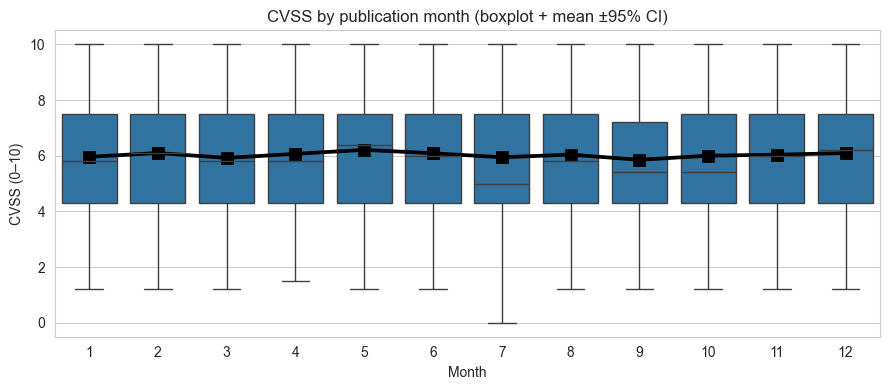

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal

# Build month-of-year and keep rows with valid cvss + month
d = pd.DataFrame({
    "cvss": pd.to_numeric(df["cvss"], errors="coerce"),
    "month": pd.to_datetime(df["pub_date"], errors="coerce").dt.month
}).dropna()

# 1) Visualization: boxplots + monthly means with 95% CI
fig, ax = plt.subplots(figsize=(9, 4))
sns.boxplot(data=d, x="month", y="cvss", ax=ax, showfliers=False)
sns.pointplot(data=d, x="month", y="cvss", errorbar=("ci", 95),
              ax=ax, color="black", markers="s", linestyles="-")
ax.set_title("CVSS by publication month (boxplot + mean ±95% CI)")
ax.set_xlabel("Month")
ax.set_ylabel("CVSS (0–10)")
plt.tight_layout()
plt.show()


Критерий Краскела — Уоллиса используется для проверки на равенство медиан нескольких выборок. Мы можем применить его для сравнения распределений по месяцам.

In [23]:
# 2) Seasonality test: Kruskal–Wallis across 12 month groups
groups = [g["cvss"].values for _, g in d.groupby("month")]
H, p = kruskal(*groups)
k, n = len(groups), len(d)
eps2 = (H - k + 1) / (n - k)  # epsilon-squared effect size

print(f"Kruskal–Wallis: H={H:.2f}, p={p:.3g}, epsilon^2={eps2:.3f} (k={k}, n={n})")
print(f"Month is statistically {'' if p < ALPHA else 'in'}significant with significance level {ALPHA:.2f}")


Kruskal–Wallis: H=138.66, p=3.06e-24, epsilon^2=0.001 (k=12, n=89660)
Month is statistically significant with significance level 0.05


Замечаем статистически значимую разницу `cvss` по месяцам (т. к. $p > \alpha$), видим, что в июле (7-й месяц) медиана существенно меньше, чем в других месяцах. Но практический эффект незначительный (т. к. очень маленькое значение $\varepsilon^2 = 0.001$)

## 3.1 Визуализация данных
Визуализация с помощью `matplotlib` и `seaborn` выполнялась ранее. Попробуем более "продвинутые" инструменты для визуализации данных с возможностью интерактивной визуализации.

Визуализировать будем ключевые графики для иллюстрации гипотез (см. п. 1.1.4)
- $H_{0}^{(1)}$. Между датой публикации `pub_date` и базовым баллом `cvss` нет монотонной связи. 
    - Основной график: Линейная диаграмма (график) изменения медианного балла `cvss`, с группировкой по месяцу, с IQR-интервалом (Q1...Q3).
    - Дополнительные графики (опционально):
        - Box-plot балла `cvss` с группировкой по нескольким годам.
- $H_{0}^{(2)}$. Увеличение количества `COMPLETE` среди `{impact_integrity, impact_confidentiality, impact_availability}` не увеличивает `cvss`.   
    - Основной график: Box-plot `cvss` с группировкой по $k = 0, \dots, 3$, где $k$ -- количество `COMPLETE` среди этих метрик.
    - Дополнительные графики (опционально):
        - 3 тепловые карты 3x3 (возможно, одна, с вариацией третьей категории, если интерактивная визуализация позволяет) по всем категориям `{impact_integrity, impact_confidentiality, impact_availability}`
- $H_{0}^{(3)}$. Выполняется правило `Impact==0 => BaseScore==0` (`Impact == 0`, когда `impact_integrity == impact_confidentiality == impact_availability == 'NONE'`)
    - Основной график: Тепловая карта (по горизонтали: `Impact` (`==0`, `!=0`), по вертикали: `BaseScore` (`==0`, `>0`))
    - Дополнительные графики (опционально):
        - Lollipop-plot для top-n (по `cvss`) нарушителей, где каждая подпись соответствует `pub_date`, а длина `lollipop` соответствует `cvss`. Использовать, только если нарушители найдутся.
Для интерактивной визуализации данных используем библиотеку `plotly`. Установим её:

In [24]:
!pip install plotly statsmodels


[notice] A new release of pip is available: 23.2.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [26]:
df_augm = df.copy()
assert df_augm.shape[0] == df.shape[0], "Dataframe copy failed: data shape mismatch"
assert df_augm is not df

In [27]:
df_augm["year"] = df_augm["pub_date"].dt.year
df_augm["year_month"] = df_augm["pub_date"].dt.to_period("M").dt.to_timestamp()

df_augm["k_complete"] = (
        df_augm[["impact_confidentiality", "impact_integrity", "impact_availability"]] == "COMPLETE"
).sum(axis=1).astype(int)
df_augm["impact_zero"] = (
        df_augm[["impact_confidentiality", "impact_integrity", "impact_availability"]] == "NONE"
).all(axis=1)
df_augm["impact_zero_violation"] = df_augm["impact_zero"].isna()
df_augm[["year", "year_month", "k_complete", "impact_zero"]].describe(include="all")

,year,year_month,k_complete,impact_zero
count,89660.000000,89660,89660.000000,89660
unique,NaN,NaN,NaN,2
top,NaN,NaN,NaN,False
freq,NaN,NaN,NaN,89659
mean,2014.677827,2015-02-23 02:44:43.096140800,0.608688,NaN
min,1999.000000,1999-01-01 00:00:00,0.000000,NaN
25%,2012.000000,2012-04-01 00:00:00,0.000000,NaN
50%,2016.000000,2016-08-01 00:00:00,0.000000,NaN
75%,2018.000000,2018-06-01 00:00:00,0.000000,NaN
max,2019.000000,2019-11-01 00:00:00,3.000000,NaN


#### $H_{0}^{(1)}$. Линейная диаграмма (график) изменения медианного балла `cvss`, с группировкой по месяцу, с IQR-интервалом (Q1...Q3) и линейным трендом.

In [28]:
agg = (
    df_augm.groupby("year_month", as_index=False)
      .agg(cvss_median=("cvss", "median"),
           cvss_q25=("cvss", lambda x: np.percentile(x, 25)),
           cvss_q75=("cvss", lambda x: np.percentile(x, 75)),
           n=("cvss", "size"))
)

month_idx = (agg["year_month"].dt.year * 12 + agg["year_month"].dt.month).astype(int)
x = (month_idx - month_idx.iloc[0]).to_numpy(dtype=float)  # 0, 1, 2, ...
y = agg["cvss_median"].to_numpy(dtype=float)
# Fit y = a + b*x  (b = slope per month, a = intercept at first month)
b_month, a = np.polyfit(x, y, 1)
# R²
y_hat = a + b_month * x
ss_res = np.sum((y - y_hat) ** 2)
ss_tot = np.sum((y - y.mean()) ** 2)
r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan
# Slope per year for readability
b_year = b_month * 12.0

fig = go.Figure()

# IQR ribbon
fig.add_trace(go.Scatter(
    x=agg["year_month"], y=agg["cvss_q75"],
    mode="lines", line=dict(width=0),
    hoverinfo="skip", showlegend=False
))
fig.add_trace(go.Scatter(
    x=agg["year_month"], y=agg["cvss_q25"],
    mode="lines",
    line=dict(width=1, color="rgba(99,110,250,0)"),  # thin boundary so legend has a sample
    fill="tonexty", fillcolor="rgba(99,110,250,0.2)",
    name="IQR (Q25–Q75)",
    hoverinfo="skip",
    showlegend=True
))

# Median line
fig.add_trace(go.Scatter(
    x=agg["year_month"], y=agg["cvss_median"],
    mode="lines+markers",
    name="Median CVSS",
    hovertemplate="Month=%{x|%Y-%m}<br>Median=%{y:.2f}<br>N=%{customdata}",
    customdata=np.array(agg["n"]).reshape(-1, 1)
))

# Add trend line over the existing x grid to keep dates aligned
fig.add_trace(go.Scatter(
    x=agg["year_month"],
    y=y_hat,
    mode="lines",
    line=dict(color="red", width=2),
    name=f"Linear trend: y = {a:.3f} + {b_year:.3f}t  (R²={r2:.3f})",
    hoverinfo="skip"
))

fig.update_layout(
    title="CVSS over time (monthly median with IQR band)",
    xaxis_title="Year and month",
    yaxis_title="CVSS",
    width=1280, # Change depending on your screen
    template="plotly_white"
)
fig.show()

На графике представлен медианный балл CVSS по месяцам.

Нулевая ширина IQR (межквартильного размаха) демонстрирует, что либо в указанном месяце была только одна запись, либо значения `cvss` между Q25 и Q75 были одинаковыми (что может быть обусловлено либо дубликатами, либо очень маленьким числом наблюдений).

Линейный тренд показывает незначительное уменьшение балла `cvss` в среднем с течением времени. Оно слабое ($\rho=-0.15$, $R^2 = 0.091$ (для линейного тренда по месяцам)), тем не менее, статистически значимое (для $\alpha=0.05$ по тесту ранговой корреляции Спирмена). Это согласуется с выполненными ранее статистическими тестами.

#### $H_{0}^{(1)}$. Box-plot балла `cvss` с группировкой по нескольким годам.

In [29]:
# Boxplot of CVSS by 5-year periods starting from df_augm["year"].min()

df5 = df_augm.dropna(subset=["year", "cvss"]).copy()
start = int(df5["year"].min())
end = int(df5["year"].max())

# Bin edges: [start, start+5, ..., >= end]
YEARS_BY_BIN = 4
edges = np.arange(start, end + YEARS_BY_BIN, YEARS_BY_BIN)
labels = [f"{edges[i]}–{edges[i+1]-1}" for i in range(len(edges) - 1)]

df5["year_5y"] = pd.cut(
    df5["year"].astype(int),
    bins=edges,
    right=False,              # include left edge, exclude right (e.g., 2000–2004 means [2000,2005))
    labels=labels,
    include_lowest=True
)
# median CVSS per displayed bin, in the same order as on the x-axis
grp = (df5.dropna(subset=["year_5y", "cvss"])
         .groupby("year_5y", observed=True)["cvss"]
         .median()
         .reindex(labels)  # keep x-order
         .dropna()
         .reset_index(name="cvss_median"))

# numeric x for regression: bin centers in years
label_to_center = {f"{edges[i]}–{edges[i+1]-1}": edges[i] + YEARS_BY_BIN/2
                   for i in range(len(edges) - 1)}
x_year = grp["year_5y"].astype(str).map(label_to_center).to_numpy(float)
y = grp["cvss_median"].to_numpy(float)

# fit y = a + b * t_year, where t_year = years since first bin center
t = x_year - x_year.min()
b, a = np.polyfit(t, y, 1)           # b: slope per year; a: value at first bin center
y_hat = a + b * t

# R²
ss_res = ((y - y_hat) ** 2).sum()
ss_tot = ((y - y.mean()) ** 2).sum()
r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")

fig = px.box(
    df5,
    x="year_5y",
    y="cvss",
    points="outliers",
    category_orders={"year_5y": labels},
    labels={"year_5y": f"{YEARS_BY_BIN}-year period", "cvss": "CVSS"}
)
fig.add_trace(
    go.Scatter(
        x=grp["year_5y"].astype(str),
        y=y_hat,
        mode="lines",
        line=dict(color="purple", width=2),
        name=f"Linear trend: y = {a:.3f} + {b:.3f}t  (R²={r2:.3f})",
        hoverinfo="skip"
    )
)
fig.update_layout(
    title=f"CVSS by {YEARS_BY_BIN}-year periods (boxplot)",
    width=1280,
    template="plotly_white",
    xaxis=dict(type="category")
)
fig.show()

На box-plot можно также видеть, что с течением времени нижняя граница выбросов (`q1 - 1.5 * iqr`, `lower_fence`) несколько убывает.

Медиана в последние годы также демонстрирует склонность к уменьшению.

Это согласуется с предыдущими наблюдениями и тестами.

#### $H_{0}^{(2)}$. Box-plot `cvss` с группировкой по $k = 0, \dots, 3$.

In [30]:
# --- Linear trend across k=0..3 (fit to per-bin medians) with slight extension ---

# median CVSS per k (keep axis order 0,1,2,3)
grp = (df_augm.dropna(subset=["k_complete", "cvss"])
         .groupby("k_complete", observed=True)["cvss"]
         .median()
         .reindex([0, 1, 2, 3])
         .dropna()
         .reset_index(name="cvss_median"))

xk = grp["k_complete"].to_numpy(float)           # 0,1,2,3 (or a subset)
y  = grp["cvss_median"].to_numpy(float)

# fit y = a + b * k
b, a = np.polyfit(xk, y, 1)
y_hat_bins = a + b * xk

# R²
ss_res = np.sum((y - y_hat_bins) ** 2)
ss_tot = np.sum((y - y.mean()) ** 2)
r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")

# extend the line a little beyond the first/last category
ext = 0.5                                 # ~15% of a bin to each side
x_min, x_max = float(xk.min()), float(xk.max())
x_line = np.array([x_min - ext, x_max + ext])
y_line = a + b * x_line

fig = px.box(
    df_augm, x="k_complete", y="cvss",
    labels={"k_complete": "Count of COMPLETE in {C,I,A}", "cvss": "CVSS"},
    category_orders={"k_complete": [0, 1, 2, 3]}
)
# draw on an overlay numeric axis so it can extend beyond categorical boxes
fig.add_trace(
    go.Scatter(
        x=x_line, y=y_line,
        mode="lines",
        line=dict(color="red", width=2),
        name=f"Linear trend: y = {a:.3f} + {b:.3f}·k  (R²={r2:.3f})",
        hoverinfo="skip",
        xaxis="x2"
    )
)

# align the hidden numeric axis with categorical slots (0..3)
fig.update_layout(
    xaxis2=dict(
        overlaying="x",
        side="bottom",
        range=[-0.5, 3.5],        # if you only have a subset, use [x_min-0.5, x_max+0.5]
        showticklabels=False,
        showgrid=False,
        zeroline=False
    )
)
fig.update_layout(
    title="CVSS vs number of COMPLETE impacts",
    template="plotly_white",
    width=1280
)
fig.show()

На этом box-plot также можно видеть:
- С возрастанием $k$ также монотонно возрастают `lower_fence`, `q1` и `q3` по `cvss`.
- При $k=3$ (т. е. из `C`, `I`, `A` все -- `COMPLETE`) `q3` доходит до 10 (максимального возможного значения базового балла `cvss`).
- Медиана также имеет тенденцию к увеличению с возрастанием $k$.

В целом, это согласовано с предыдущими наблюдениями и статистическими тестами.

#### Интерактивная тепловая карта 3x3 (с вариацией третьей категории) `cvss` по всем категориям `C`, `I`, `A`

In [31]:
order_tri = ["NONE", "PARTIAL", "COMPLETE"]
cmin = float(df["cvss"].min())
cmax = float(df["cvss"].max())

fig = px.density_heatmap(
    df,
    x="impact_confidentiality",
    y="impact_integrity",
    z="cvss",
    histfunc="avg",
    animation_frame="impact_availability",
    category_orders={
        "impact_confidentiality": order_tri,
        "impact_integrity": order_tri,
        "impact_availability": order_tri
    },
    color_continuous_scale="Viridis",
    range_color=(cmin, cmax),
    text_auto=".2f",  # ⟵ labels on cells
    labels={
        "impact_confidentiality": "Confidentiality",
        "impact_integrity": "Integrity",
        "impact_availability": "Availability",
        "cvss": "Mean CVSS"
    }
)

fig.update_layout(
    title="Mean CVSS across C×I (use slider for Availability)",
    template="plotly_white",
    width=960,
)

nx = len(order_tri)  # categories on X
ny = len(order_tri)  # categories on Y

# 1) lock aspect so one step on Y == one step on X
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain="domain")
fig.update_yaxes(constrain="domain")

# 2) size the figure so the drawable area matches the grid aspect
#    (rough but effective; tweak margins/cell_px to taste)
cell_px = 110   # pixels per cell
margins = dict(l=70, r=110, t=60, b=60)  # r includes room for colorbar

fig.update_layout(
    width = cell_px * nx + margins["l"] + margins["r"],
    height= cell_px * ny + margins["t"] + margins["b"],
    margin=margins
)

fig.show()


Хотя эта визуализация и демонстрирует, что средний `cvss` не всегда растёт монотонно с возрастанием "серьёзности" `C`, `I`, `A`, всё же в целом наблюдается рост `cvss` по мере возрастания количества `COMPLETE`.

#### $H_{0}^{(3)}$. Тепловая карта (по горизонтали: `Impact` (`==0`, `!=0`), по вертикали: `BaseScore` (`==0`, `>0`))

In [32]:
summary = pd.Series({
    "holds": int((~df_augm["impact_zero_violation"]).sum()),
    "violations": int(df_augm["impact_zero_violation"].sum())
})
summary


holds         89660
violations        0
dtype: int64

In [33]:
# 1) Boolean flags
impact_zero = (
    (df_augm["impact_confidentiality"] == "NONE")
    & (df_augm["impact_integrity"] == "NONE")
    & (df_augm["impact_availability"] == "NONE")
)

base_nonzero = (pd.to_numeric(df_augm["cvss"], errors="coerce").fillna(0).round(6) != 0)

# 2) Human-readable labels for the 2×2
row_label = np.where(base_nonzero, "Base > 0", "Base = 0")
col_label = np.where(impact_zero, "Impact = 0", "Impact ≠ 0")

# 3) 2×2 contingency (counts) with fixed order
order_rows = ["Base > 0", "Base = 0"]
order_cols = ["Impact = 0", "Impact ≠ 0"]

ct = pd.crosstab(pd.Categorical(row_label, categories=order_rows, ordered=True),
                 pd.Categorical(col_label, categories=order_cols, ordered=True))

ct = ct.reindex(index=order_rows, columns=order_cols, fill_value=0)

total = int(ct.to_numpy().sum())
pct = (ct / total * 100).round(1)

# one heatmap: color by %, text shows "count (pct%)"
text = [[f"{ct.iloc[i, j]}<br>({pct.iloc[i, j]:.1f}%)"
         for j in range(ct.shape[1])]
        for i in range(ct.shape[0])]

fig1 = go.Figure(
    go.Heatmap(
        customdata=ct.values,
        z=pct.values,                       # color encodes percent
        x=ct.columns.tolist(),              # ["Impact=0","Impact≠0"]
        y=ct.index.tolist(),                # ["Base=0","Base>0"]
        zmin=0, zmax=100,
        colorscale="Blues",
        colorbar=dict(title="% of total"),
        text=text,
        texttemplate="%{text}",
        textfont=dict(size=14),
        hovertemplate="%{x}, %{y}<br>Count = %{customdata}<br>Percent = %{z:.1f}<extra></extra>"
    )
)

# titles and axis ordering
fig1.update_layout(
    title=f"Rule check: Impact==0 ⇒ BaseScore==0  (n={total})",
    template="plotly_white",
)
fig1.update_xaxes(categoryorder="array", categoryarray=order_cols, title="Impact flag")
fig1.update_yaxes(categoryorder="array", categoryarray=order_rows, title="BaseScore flag")

# make the 2×2 cells square and size the canvas
fig1.update_yaxes(scaleanchor="x", scaleratio=1)
cell_px = 180
margins = dict(l=60, r=120, t=60, b=60)
fig1.update_layout(
    width = 2*cell_px + margins["l"] + margins["r"],
    height= 2*cell_px + margins["t"] + margins["b"],
    margin=margins
)

fig1.show()



Видим, что не было ни одного случая нарушения, когда при `Impact == 0` получалось значение `cvss > 0`.

Это не даёт основания говорить, что во всех случаях не было нарушений при подсчёте cvss. Однако это согласуется  с формулами расчёта `cvss`, где $f(Impact)$ является одним из множителей в последней формуле.

Также визуализируем некоторые ошибки (топ-n) в расчёте cvss:

In [34]:
import numpy as np
import pandas as pd

TOP_N = 10  # change as needed

df_err = df2.copy()
df_err = df_err[df_err["cvss_mismatch"]]

# Robust numeric cast (in case cvss was read as string)
df_err["cvss"] = pd.to_numeric(df_err["cvss"], errors="coerce")
df_err["cvss_calculated"] = pd.to_numeric(df_err["cvss_calculated"], errors="coerce")

# Keep rows where both are present
df_err = df_err.dropna(subset=["cvss", "cvss_calculated"]).copy()

# Error metrics
df_err["err"] = df_err["cvss"] - df_err["cvss_calculated"]
df_err["abs_err"] = df_err["err"].abs()
df_err["direction"] = np.where(df_err["err"] >= 0, "CVSS listed > calculated", "CVSS listed < calculated")

# Try to use a sensible ID column; fall back to the first column if needed
id_col = "cve_id" if "cve_id" in df_err.columns else df_err.columns[0]

# Top-N by absolute error
df_top_err = (
    df_err.sort_values("abs_err", ascending=False)
          .copy()
)

MAXLEN = 40
s = df_top_err["summary"].astype(str)
df_top_err["summary_short"] = np.where(
    s.str.len() > MAXLEN, s.str.slice(0, MAXLEN - 1) + "…", s
)

df_top_err[["cvss", "cvss_calculated", "abs_err"]]

,cvss,cvss_calculated,abs_err
2423,2.1,5.0,2.9
22158,2.1,4.3,2.2
21021,6.5,5.5,1.0
21020,6.5,5.5,1.0
3071,3.6,3.2,0.4
18384,4.4,4.6,0.2


In [35]:
# Lollipop chart of signed error (CVSS listed − calculated), x-range symmetric to ±max|error|
color_map = {"CVSS listed > calculated": "#636EFA", "CVSS listed < calculated": "#EF553B"}

# Ensure sorted order (largest error at top)
dft = df_top_err.sort_values("abs_err", ascending=True).copy()

# Legend-friendly labels matching your color_map keys
dft["direction_label"] = np.where(
    dft["err"] >= 0, "CVSS listed > calculated", "CVSS listed < calculated"
)

# Y order (keep the sorted order so largest error ends up on top)
y_order = dft[id_col].tolist()

# Symmetric x-range by max absolute error
max_abs = float(dft["abs_err"].max())
xpad = 0.05 * max_abs  # small padding
xmin, xmax = -(max_abs + xpad), (max_abs + xpad)

# Build figure
fig = go.Figure()

# 1) Stem lines from 0 to each signed error (colored by sign)
for row in dft.itertuples(index=False):
    cve = getattr(row, id_col)
    err_val = float(row.err)
    label = row.direction_label
    fig.add_trace(
        go.Scatter(
            x=[0.0, err_val],
            y=[cve, cve],
            mode="lines",
            line=dict(color=color_map.get(label, "#888"), width=3),
            showlegend=False,
            hoverinfo="skip",
        )
    )

# 2) Lollipop markers (two traces to get a clean legend)
for label in ["CVSS listed > calculated", "CVSS listed < calculated"]:
    sub = dft[dft["direction_label"] == label]
    if sub.empty:
        continue
    fig.add_trace(
        go.Scatter(
            x=sub["err"],
            y=sub[id_col],
            mode="markers",
            name=label,
            marker=dict(color=color_map.get(label, "#888"), size=10),
            customdata=np.stack(
                [sub["abs_err"], sub["cvss"], sub["cvss_calculated"], sub["summary_short"]], axis=-1
            ),
            hovertemplate=(
                f"{id_col}=%{{y}}<br>"
                "err=%{x:.2f}<br>"
                "|err|=%{customdata[0]:.2f}<br>"
                "CVSS listed=%{customdata[1]:.2f}<br>"
                "CVSS calculated=%{customdata[2]:.2f}<br>"
                "summary=%{customdata[3]}<br>"
                "<extra></extra>"
            ),
        )
    )

# Zero reference line
fig.add_vline(x=0, line_dash="dash", line_color="gray", line_width=1)

# Layout and axes
fig.update_layout(
    title=f"Top {TOP_N} CVEs by signed CVSS error (lollipop)",
    template="plotly_white",
    width=1200,
    xaxis_title="Signed error (CVSS listed - calculated)",
    yaxis_title="CVE-ID",
)

fig.update_xaxes(range=[xmin, xmax], zeroline=True, zerolinecolor="gray", zerolinewidth=1)
fig.update_yaxes(type="category", categoryorder="array", categoryarray=y_order)

fig.show()


В датасете таких ошибочных случаев было мало (всего 6). На графике представлены они все, по убыванию абсолютного значения ошибки.

## 4.1. Моделирование и прогнозирование

Постановка задачи: "научить" модели машинного обучения приближённо предсказывать CVSS Base Score, не зная формулы. Как было показано ранее, формула:

$$
Exploitability = 20 \cdot AV \cdot AC \cdot Au
$$
$$
Impact = 10.41 \cdot (1 - (1 - C) \cdot (1 - I) \cdot (1 - A))
$$
$$
f(Impact) = \begin{cases}
0 \text{, if } Impact = 0 \\
1.176 \text{, otherwise}
\end{cases}
$$
$$
BaseScore = \text{roundTo1Decimal}(((0.6 \cdot I) + ((0.4 \cdot E) - 1.5) \cdot f(Impact))
$$

достаточно сложная, вычисляется в несколько шагов, итоговая функция "кусочная" и сложно зависит от своих аргументов.

### 4.1.1 Выбор признаков

Для моделирования и прогнозирования используем следующие признаки:
- `access_authentication`
- `access_complexity`
- `access_vector`
- `impact_availability`
- `impact_confidentiality`
- `impact_integrity`

Целевая переменная: `cvss`.

Выбранные признаки -- категориальные порядковые. Можно их закодировать, используя порядковый номер (в порядке возрастания числового значения для коэффициента).

Целевая переменная `cvss` -- это число (числовой, непрерывный признак), он не нуждается в кодировании.

In [36]:
from sklearn.base import RegressorMixin
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import OrdinalEncoder, FunctionTransformer, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

In [37]:
base_features: list[str] = [
    "access_authentication",
    "access_complexity",
    "access_vector",
    "impact_availability",
    "impact_confidentiality",
    "impact_integrity"
]
target_col = "cvss"

In [38]:
ordinal_categories: dict[str, list[str]] = {
    "access_authentication": ["MULTIPLE", "SINGLE", "NONE"],
    "access_complexity": ["HIGH", "MEDIUM", "LOW"],
    "access_vector": ["LOCAL", "ADJACENT_NETWORK", "NETWORK"],
    "impact_availability": ["NONE", "PARTIAL", "COMPLETE"],
    "impact_confidentiality": ["NONE", "PARTIAL", "COMPLETE"],
    "impact_integrity": ["NONE", "PARTIAL", "COMPLETE"]
}

ordinal_categories_list = [ordinal_categories[col] for col in base_features]
ordinal_categories_list

[['MULTIPLE', 'SINGLE', 'NONE'],
 ['HIGH', 'MEDIUM', 'LOW'],
 ['LOCAL', 'ADJACENT_NETWORK', 'NETWORK'],
 ['NONE', 'PARTIAL', 'COMPLETE'],
 ['NONE', 'PARTIAL', 'COMPLETE'],
 ['NONE', 'PARTIAL', 'COMPLETE']]

### 4.1.2 Стандартизация и нормализация

Стандартизация -- это трансформация числовых признаков следующего вида:
$$
z_i = \cfrac{x_i - \mu}{\sigma},
$$

где $\mu$ -- среднее, $\sigma$ -- среднеквадратичное отклонение.

- После применения этой трансформации для каждого признака $\mu \approx 0$ и $\sigma \approx 1$. Это может быть полезно для линейных моделей (например, Linear Regression), так как они в этом случае сходятся лучше и результаты лучше сравнимы.
- Масштаб признаков (который и характеризуют $\mu$ и $\sigma$) может сильно влиять на точность предсказаний.

Нормализация -- трансформация, которая масштабирует признак и приводит его к некоторому конечному диапазону, например, $[0, 1]$:

$$
x_i' = \cfrac{x_i - x_{\min}}{x_{\max} - x_{\min}}.
$$

Иногда приведение значений к фиксированному диапазону может быть полезно, например, метрики расстояния, входные значения для некоторых нейросетей и т. д.

В нашем случае применение этих преобразований не меняется обязательных. Исходные категориальные признаки имели 3 значения, соответственно, мы можем их закодировать как числа в диапазоне $0 \dots 2$.

Можно также попробовать закодировать признаки их "истинными" числовыми значениями из стандарта CVSS v2.0 (например, `Confidentiality`: `NONE = 0`, `PARTIAL = 0.275`, `COMPLETE = 0.660`). Это, возможно, существенно повысит качество предсказания.

In [39]:
cvss_value_maps: dict[str, dict[str, float]] = {
    "access_vector": {
        "LOCAL": 0.395,
        "ADJACENT_NETWORK": 0.646,
        "NETWORK": 1.0
    },
    "access_complexity": {
        "HIGH": 0.35,
        "MEDIUM": 0.61,
        "LOW": 0.71
    },
    "access_authentication": {
        "MULTIPLE": 0.45,
        "SINGLE": 0.56,
        "NONE": 0.704
    },
    "impact_confidentiality": {
        "NONE": 0.0,
        "PARTIAL": 0.275,
        "COMPLETE": 0.66
    },
    "impact_integrity": {
        "NONE": 0.0,
        "PARTIAL": 0.275,
        "COMPLETE": 0.66
    },
    "impact_availability": {
        "NONE": 0.0,
        "PARTIAL": 0.275,
        "COMPLETE": 0.66
    }
}

df3 = df.copy().dropna(subset=base_features + [target_col])
df3['cvss_calculated'] = df3.apply(
    lambda row: float(cvss_v2_basic_score_precise(
            access_authentication=row['access_authentication'],
            access_complexity=row['access_complexity'],
            access_vector=row['access_vector'],
            impact_confidentiality=row['impact_confidentiality'],
            impact_integrity=row['impact_integrity'],
            impact_availability=row['impact_availability']
    )),
    axis=1
)
df3 = df3[np.abs(df3['cvss'] - df3['cvss_calculated']) < 1e-6]
df3.shape[0]

88770

In [40]:
def cvss_weights_transform(X: np.ndarray) -> np.ndarray:
    """
    X: 2D array of shape (n_samples, len(base_features)) with string categories.
    Returns: same shape, with each category replaced by its CVSS v2 weight.
    """
    X = np.asarray(X)
    n_samples, n_features = X.shape

    X_out = np.zeros((n_samples, n_features), dtype=float)

    for j, col in enumerate(base_features):
        mapping = cvss_value_maps[col]
        col_vals = X[:, j]
        # Use dict.__getitem__ to raise if unexpected category appears
        X_out[:, j] = np.vectorize(mapping.__getitem__)(col_vals)

    return X_out

def build_preprocessor(use_cvss_weights: bool = False) -> ColumnTransformer:
    """
    If use_cvss_weights is False:
        - encode base_features with OrdinalEncoder (0, 1, 2)
    If use_cvss_weights is True:
        - map categories to real CVSS v2 weights via FunctionTransformer
    """
    if use_cvss_weights:
        base_transformer = FunctionTransformer(
            cvss_weights_transform,
            feature_names_out="one-to-one"
        )
    else:
        base_transformer = OrdinalEncoder(
            categories=ordinal_categories_list
        )

    preprocessor = ColumnTransformer(
        transformers=[
            ("base", base_transformer, base_features)
        ],
        remainder="drop"
    )

    return preprocessor


In [41]:
def build_regression_pipeline(
    model: RegressorMixin,
    use_cvss_weights: bool = False
) -> Pipeline:
    preprocessor = build_preprocessor(use_cvss_weights=use_cvss_weights)

    pipeline = Pipeline(
        steps=[
            ("preprocess", preprocessor),
            ("scale", StandardScaler()),
            ("model", model)
        ]
    )
    return pipeline


### 4.1.3 Разделить данные на обучающую и тестовую выборки

Используем функцию `train_test_split` из библиотеки `scikit-learn`.

In [42]:
X = df3[base_features].dropna().copy()
y = df3[target_col].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=267
)


### 4.1.4 Выбор моделей ML

In [43]:
models = {
    "LinearRegression": LinearRegression(),
    "DecisionTree": DecisionTreeRegressor(
        max_depth=5,
        random_state=267
    ),
    "RandomForest": RandomForestRegressor(
        n_estimators=200,
        random_state=267,
        n_jobs=-1
    ),
    "GradientBoosting": GradientBoostingRegressor(
        random_state=267
    )
}


In [44]:
from typing import Dict, Tuple

def evaluate_model(
    name: str,
    model,
    X_train: pd.DataFrame,
    y_train: pd.Series,
    X_test: pd.DataFrame,
    y_test: pd.Series,
    use_cvss_weights: bool = False,
    cv_splits: int = 5,
) -> Tuple[np.ndarray, Dict[str, float]]:
    pipeline = build_regression_pipeline(
        model=model,
        use_cvss_weights=use_cvss_weights
    )

    cv = KFold(
        n_splits=cv_splits,
        shuffle=True,
        random_state=42
    )

    rmse_scores = -cross_val_score(
        pipeline,
        X_train,
        y_train,
        scoring="neg_root_mean_squared_error",
        cv=cv
    )

    mae_scores = -cross_val_score(
        pipeline,
        X_train,
        y_train,
        scoring="neg_mean_absolute_error",
        cv=cv
    )

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    test_rmse = mean_squared_error(y_test, y_pred)
    test_mae = mean_absolute_error(y_test, y_pred)
    test_r2 = r2_score(y_test, y_pred)

    mode = "cvss_weights" if use_cvss_weights else "ordinal"

    print(f"=== {name} [{mode}] ===")
    print(f"CV RMSE: mean={rmse_scores.mean():.4f}, std={rmse_scores.std():.4f}")
    print(f"CV MAE:  mean={mae_scores.mean():.4f}, std={mae_scores.std():.4f}")
    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Test MAE:  {test_mae:.4f}")
    print(f"Test R^2:  {test_r2:.4f}")
    print()

    metrics = {
        "rmse": float(test_rmse),
        "mae": float(test_mae),
        "r2": float(test_r2)
    }

    return y_pred, metrics

In [45]:
predictions_ordinal: Dict[str, np.ndarray] = {}
predictions_weights: Dict[str, np.ndarray] = {}
metrics_ordinal: Dict[str, Dict[str, float]] = {}
metrics_weights: Dict[str, Dict[str, float]] = {}

for name, model in models.items():
    y_pred_ord, m_ord = evaluate_model(
        name=name,
        model=model,
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
        y_test=y_test,
        use_cvss_weights=False
    )
    predictions_ordinal[name] = y_pred_ord
    metrics_ordinal[name] = m_ord

for name, model in models.items():
    y_pred_w, m_w = evaluate_model(
        name=name,
        model=model,
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
        y_test=y_test,
        use_cvss_weights=True
    )
    predictions_weights[name] = y_pred_w
    metrics_weights[name] = m_w


=== LinearRegression [ordinal] ===
CV RMSE: mean=0.4011, std=0.0054
CV MAE:  mean=0.2887, std=0.0030
Test RMSE: 0.1639
Test MAE:  0.2918
Test R^2:  0.9590

=== DecisionTree [ordinal] ===
CV RMSE: mean=0.4486, std=0.0059
CV MAE:  mean=0.2594, std=0.0198
Test RMSE: 0.2027
Test MAE:  0.2491
Test R^2:  0.9493

=== RandomForest [ordinal] ===
CV RMSE: mean=0.0318, std=0.0087
CV MAE:  mean=0.0011, std=0.0002
Test RMSE: 0.0006
Test MAE:  0.0008
Test R^2:  0.9999

=== GradientBoosting [ordinal] ===
CV RMSE: mean=0.0872, std=0.0044
CV MAE:  mean=0.0429, std=0.0020
Test RMSE: 0.0079
Test MAE:  0.0458
Test R^2:  0.9980

=== LinearRegression [cvss_weights] ===
CV RMSE: mean=0.4719, std=0.0036
CV MAE:  mean=0.4186, std=0.0018
Test RMSE: 0.2261
Test MAE:  0.4219
Test R^2:  0.9434

=== DecisionTree [cvss_weights] ===
CV RMSE: mean=0.4486, std=0.0059
CV MAE:  mean=0.2594, std=0.0198
Test RMSE: 0.2027
Test MAE:  0.2491
Test R^2:  0.9493

=== RandomForest [cvss_weights] ===
CV RMSE: mean=0.0317, std=0.00

In [46]:
def plot_pred_vs_true(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    ax: plt.Axes,
    title: str,
    color: str | None = None
) -> None:
    y_true_arr = np.asarray(y_true)
    y_pred_arr = np.asarray(y_pred)

    ax.scatter(y_true_arr, y_pred_arr, alpha=0.3, color=color)

    min_val = float(min(y_true_arr.min(), y_pred_arr.min()))
    max_val = float(max(y_true_arr.max(), y_pred_arr.max()))

    ax.plot([min_val, max_val], [min_val, max_val], linestyle="--", color=color)
    ax.set_xlabel("True CVSS")
    ax.set_ylabel("Predicted CVSS")
    ax.set_title(title)


In [47]:
def make_metrics_df(
    metrics_ord: Dict[str, Dict[str, float]],
    metrics_val: Dict[str, Dict[str, float]]
) -> pd.DataFrame:
    rows = []

    for model_name, m in metrics_ord.items():
        rows.append({
            "model": model_name,
            "encoding": "ordinal",
            "label": f"{model_name}\n(ord)",
            "rmse": m["rmse"],
            "mae": m["mae"],
            "r2": m["r2"]
        })

    for model_name, m in metrics_val.items():
        rows.append({
            "model": model_name,
            "encoding": "cvss_weights",
            "label": f"{model_name}\n(wgt)",
            "rmse": m["rmse"],
            "mae": m["mae"],
            "r2": m["r2"]
        })

    return pd.DataFrame(rows)


def plot_metric_bar(
    ax: plt.Axes,
    df_metrics: pd.DataFrame,
    metric: str,
    title: str,
    descending: bool = False
) -> None:
    """
    Draw a bar chart for one metric (rmse / mae / r2),
    sorted by that metric, with bar labels.
    """
    ascending = not descending
    df_sorted = df_metrics.sort_values(metric, ascending=ascending)

    x = np.arange(len(df_sorted))
    values = df_sorted[metric].to_numpy()
    labels = df_sorted["label"].to_list()
    encodings = df_sorted["encoding"].to_list()

    ax.bar(x, values, color=['green' if encoding == 'cvss_weights' else 'blue' for encoding in encodings])
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_title(title)
    ax.set_ylabel(metric.upper())

    # Bar value labels (3 decimal places)
    for xi, val in zip(x, values):
        ax.text(
            xi,
            val,
            f"{val:.4f}",
            ha="center",
            va="bottom",
            fontsize=8
        )


In [48]:
from matplotlib.gridspec import GridSpec

def plot_all_modes(
    y_true: pd.Series,
    predictions_ord: Dict[str, np.ndarray],
    predictions_val: Dict[str, np.ndarray],
    metrics_ord: Dict[str, Dict[str, float]],
    metrics_val: Dict[str, Dict[str, float]]
) -> None:
    model_names = list(predictions_ord.keys())
    n_models = len(model_names)

    # Build metrics DataFrame for bar charts
    df_metrics = make_metrics_df(metrics_ord, metrics_val)

    # We will have:
    #   rows 0,1,2:  bar charts for RMSE, MAE, R2 (each spans 2 columns)
    #   rows 3..:    scatter plots for each model (2 columns: ordinal vs weights)
    n_bar_rows = 3
    total_rows = n_bar_rows + n_models
    n_cols = 2

    fig = plt.figure(figsize=(10, 5 * total_rows))
    gs = GridSpec(
        nrows=total_rows,
        ncols=n_cols,
        figure=fig,
        height_ratios=[1.0, 1.0, 1.0] + [1.2] * n_models
    )

    # 1) Bar charts (each spans both columns)
    ax_rmse = fig.add_subplot(gs[0, :])
    ax_mae = fig.add_subplot(gs[1, :])
    ax_r2 = fig.add_subplot(gs[2, :])

    # Sort RMSE and MAE ascending (lower is better), R2 descending (higher is better)
    plot_metric_bar(
        ax=ax_rmse,
        df_metrics=df_metrics,
        metric="rmse",
        title="RMSE by model and encoding",
        descending=False
    )
    plot_metric_bar(
        ax=ax_mae,
        df_metrics=df_metrics,
        metric="mae",
        title="MAE by model and encoding",
        descending=False
    )
    plot_metric_bar(
        ax=ax_r2,
        df_metrics=df_metrics,
        metric="r2",
        title="R\u00b2 by model and encoding",
        descending=True
    )

    # 2) Scatter plots for each model
    for i, name in enumerate(model_names):
        row = n_bar_rows + i
        ax_ord = fig.add_subplot(gs[row, 0])
        ax_val = fig.add_subplot(gs[row, 1])

        plot_pred_vs_true(
            y_true=y_true,
            y_pred=predictions_ord[name],
            color='blue',
            ax=ax_ord,
            title=f"{name} (ordinal)"
        )
        plot_pred_vs_true(
            y_true=y_true,
            y_pred=predictions_val[name],
            color='green',
            ax=ax_val,
            title=f"{name} (CVSS weights)"
        )

    fig.suptitle(
        "Model comparison: CVSS base score regression\n"
        "Bar charts: RMSE / MAE / R\u00b2 (spanning 2 columns); "
        "Scatter: true vs predicted",
        fontsize=16
    )
    fig.tight_layout(rect=(0, 0, 1, 0.93))
    plt.show()


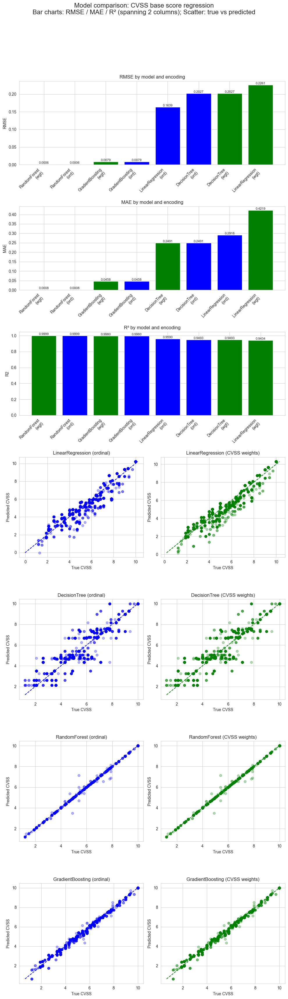

In [49]:
plot_all_modes(
    y_true=y_test,
    predictions_ord=predictions_ordinal,
    predictions_val=predictions_weights,
    metrics_ord=metrics_ordinal,
    metrics_val=metrics_weights
)


### 4.1.5 Интерпретация результатов

Использованы 4 модели машинного обучения:
- `Linear Regression`
- `Decision Tree`
- `Random Forest`
- `Gradient Boosting`

Модели `Decision Tree`, `Random Forest` и `Gradient Boosting` используют в своей основе дерево решений, для которого имеют значимость только упорядочивание исходных значений признаков и соответствующие пороговые значения. `Random Forest` и `Gradient Boosting` представляют собой надстройки над `Decision Tree` (не одно дерево, а ансамбль), которые лучше приспособлены к задачам регрессии.

В целом модели на основе деревьев предсказывают нелинейные зависимости гораздо лучше, чем линейные модели.

- `RandomForest` справляется лучше всего, с наименьшей ошибкой и наибольшим $R^2$, большинство значений предсказаны почти "идеально".
- `GradientBoosting` также справляется хорошо, но $R^2$ чуть меньше и разброс отклонений больше.
- `DecisionTree` справляется не очень хорошо, т. к. либо модель плохо детализирована, либо наоборот, могло произойти переобучение. В целом одиночное дерево решений лучше справляется с задачами классификации, а не регрессии. Число "классов" (возможных значений целевой переменной) в нашем случае очень большое (может достигать 101)
- `LinearRegression` справляется хуже всего, причём интересно, что использование числовых значений базовых метрик CVSS (а не порядковых номеров классов) только ухудшило качество предсказаний. Это связано с тем, что мы с помощью линейной модели пытаемся аппроксимировать кусочную функцию, которая нелинейно зависит от своих аргументов.